# Data Assessment & Analytics
Notes:
- change os directory location
- be aware of the number of provdied native source data files

In [1]:
# working with data
import os
import numpy as np
import pandas as pd
import geopandas as gpd # the library that lets us read in shapefiles
import geoplot as gplt # for plotting maps
import geoplot.crs as gcrs #used to pull in webdata

# visulizaiton
import missingno as msno # creates a matrix chart to show missing values
import plotly.express as px
import plotly.graph_objects as go # for subplot creation
from plotly.subplots import make_subplots # for subplot creation
import matplotlib.pyplot as mplt # use with gplt to save fig to pdf

# Cleanup
from datetime import datetime
pd.set_option('display.max_columns', 999)  # How to display all columns of a Pandas DataFrame in Jupyter Notebook

In [2]:
# Set Working Directory
workingDir = "G:/Shared drives/WaDE Data/DelawareRiverBasinCommission/AggregatedAmounts" # change here
os.chdir(workingDir)

In [3]:
# This needs to be custom per state

# Input Data
#################################################################
# Data 1: 2060report_data-release_v2110_A1_6_9_11_14_17_22
df1 = pd.read_csv('RawinputData/2060report_data-release_v2110_A1_6_9_11_14_17_22.zip')

In [4]:
# Input Data - Processed WaDE Input files
#################################################################
dfws = pd.read_csv("ProcessedInputData/watersources.csv").replace(np.nan, "")
dfwspurge = pd.read_csv("ProcessedInputData/watersources_missing.csv").replace(np.nan, "")

dfru = pd.read_csv("ProcessedInputData/reportingunits.csv").replace(np.nan, "")
dfrupurge = pd.read_csv("ProcessedInputData/reportingunits_missing.csv").replace(np.nan, "")

dfag = pd.read_csv("ProcessedInputData/aggregatedamounts.csv").replace(np.nan, "")
dfagpurge = pd.read_csv("ProcessedInputData/aggregatedamounts_missing.csv").replace(np.nan, "")

# Water Source Info
- watersources.csv

In [5]:
print(len(dfws))
dfws.head(1)

2


,WaterSourceUUID,Geometry,GNISFeatureNameCV,WaterQualityIndicatorCV,WaterSourceName,WaterSourceNativeID,WaterSourceTypeCV
0,DRBCag_WSwadeID1,,,Fresh,WaDE Blank,wadeID1,Groundwater


<AxesSubplot: >

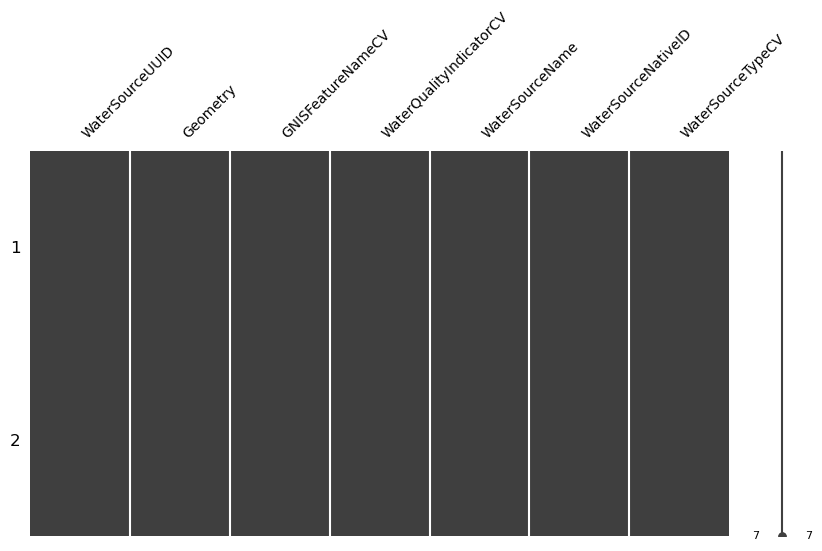

In [6]:
# Check what columns contain missing information.
msno.matrix(dfws, figsize=(10,5), fontsize=10)

In [7]:
# Unique values for 'WaterSourceTypeCV'
for x in dfws['WaterSourceTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Groundwater",
"Surface Water",


In [8]:
# WaterSourceTypeCV: histogram distribution of WaDE values
print(dfws.WaterSourceTypeCV.value_counts())

fig = px.histogram(dfws, x="WaterSourceTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of WaterSourceTypeCV Entries in watersource.csv",
                  xaxis_title="WaterSourceTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/WaterSourceTypeCV.pdf', engine="kaleido")

Groundwater      1
Surface Water    1
Name: WaterSourceTypeCV, dtype: int64


# Reporting Unit Info
- reportingunits.csv

In [9]:
print(len(dfru))
dfru.head(1)

132


,ReportingUnitUUID,EPSGCodeCV,ReportingUnitName,ReportingUnitNativeID,ReportingUnitProductVersion,ReportingUnitTypeCV,ReportingUnitUpdateDate,StateCV,Geometry
0,DRBCag_RUDB001,4326,Upper West Br Delaware River,DB-001,,Subbasin,,DE,POLYGON ((-74.82875532999998 42.39163319000005...


<AxesSubplot: >

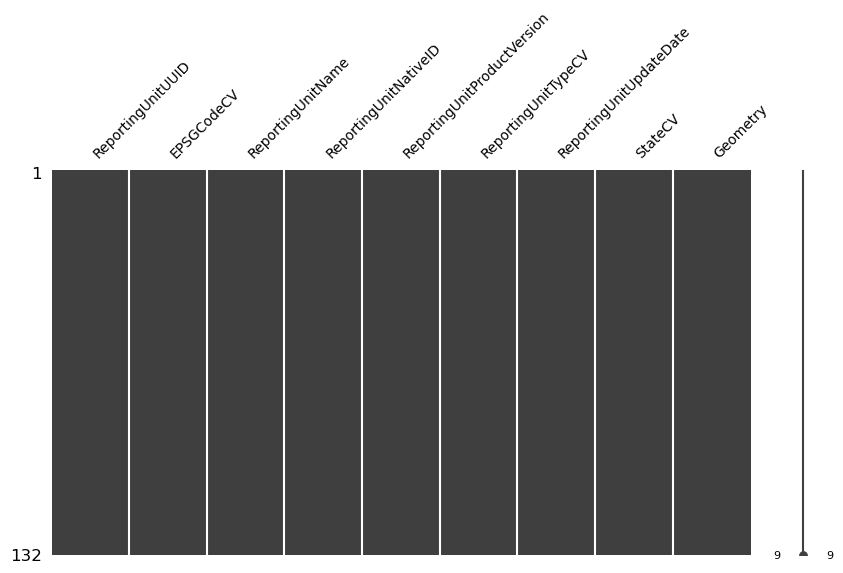

In [10]:
# Check what columns contain missing information.
msno.matrix(dfru, figsize=(10,5), fontsize=10)

In [11]:
# Unique values for 'ReportingUnitName'
for x in dfru['ReportingUnitName'].sort_values().unique():
    print(f'"' + x + '",')

"Alexauken Moore Jacobs Creeks Tribs To Delaware Riv",
"Alloway Creek Hope Creek Tribs To Delaware Bay",
"Aquashicola Cr",
"Army Redlion Dragon Creeks Tribs To Delaware Riv",
"Assiscunk Cr Burlington Edgewater Park Del Tribs",
"Assunpink Creek",
"Augustine Cr Appoquunimick Riv Blackbird Cr Tribs To Delaware Bay",
"Back Cedar Nantuxent Dividing Creeks Tribs To Delaware Bay",
"Basher Kill",
"Bear Creek",
"Beaver Dam Crcaulkins Crcooley Crhollister Cr Beaverdam Cr Peggy Run Tribs To Delaware River",
"Brandywine Cr Main Stem",
"Broadhead Cr",
"Bushkill Cr",
"Cape May West Tribs To Delaware Bay",
"Cd Canal Tribs Top Delaware Bay",
"Cedar Cr Slaughter Cr Prime Hook Cr Tribs To Delaware Bay",
"Cedar Swamp Repaupo Cr Clonmell Cr Tributaries To Delaware River",
"Cedar Swamp Smyrna Riv Duck Cr Tribs To Delaware Bay",
"Cherry Cr Caledonia Cr Tribs To Delaware River",
"Chester Cr",
"Christina River Tribs To Delaware River",
"Cohansey River",
"Cooper River",
"Crafts Creek Blacks Creek Tribs To Dela

In [12]:
# Unique values for 'ReportingUnitTypeCV'
for x in dfru['ReportingUnitTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"Subbasin",


In [13]:
# ReportingUnitTypeCV: histogram distribution of WaDE values
print(dfru.ReportingUnitTypeCV.value_counts())

fig = px.histogram(dfru, x="ReportingUnitTypeCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of ReportingUnitTypeCV Entries in reportingunit.csv",
                  xaxis_title="ReportingUnitTypeCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/ReportingUnitTypeCV.pdf', engine="kaleido")

Subbasin    132
Name: ReportingUnitTypeCV, dtype: int64


In [14]:
# StateCV: histogram distribution of WaDE values
print(dfru.StateCV.value_counts())

fig = px.histogram(dfru, x="StateCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of StateCV Entries in reportingunit.csv",
                  xaxis_title="StateCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/StateCV.pdf', engine="kaleido")

DE    132
Name: StateCV, dtype: int64


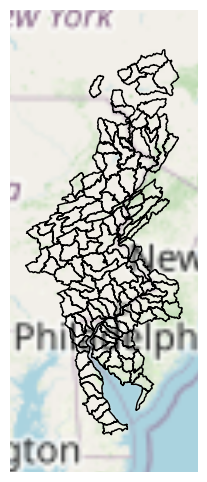

In [15]:
# Map poly info
try:
    contiguous_usa = gpd.read_file(gplt.datasets.get_path('contiguous_usa')) # use for background map in subplot
    ax = gplt.webmap(contiguous_usa, projection=gcrs.WebMercator()) # set subplot
    
    dfruPoly = dfru.copy()
    dfruPoly = dfruPoly[dfruPoly['Geometry'] != ""].reset_index(drop=True)
    dfruPoly['Geometry'] = gpd.GeoSeries.from_wkt(dfruPoly['Geometry'], crs="EPSG:4326")
    gdfruPoly = gpd.GeoDataFrame(dfruPoly, geometry=dfruPoly['Geometry'], crs="EPSG:4326") # covert to geodataframe
    gdfruPoly['Geometry'] = gdfruPoly.simplify(0.001) # simplify the geometry. Lower the number the larger the exported file.
    gplt.polyplot(gdfruPoly, ax=ax)
    mplt.savefig(format="pdf", fname='DataAssessment/figures/PolyMap.pdf')
except:
    print('No geometry data to plot')

In [16]:
dfruPoly.head()

,ReportingUnitUUID,EPSGCodeCV,ReportingUnitName,ReportingUnitNativeID,ReportingUnitProductVersion,ReportingUnitTypeCV,ReportingUnitUpdateDate,StateCV,Geometry,geometry
0,DRBCag_RUDB001,4326,Upper West Br Delaware River,DB-001,,Subbasin,,DE,"POLYGON ((-74.82876 42.39163, -74.82787 42.402...","POLYGON ((-74.82876 42.39163, -74.82836 42.392..."
1,DRBCag_RUDB003,4326,Middle West Br Delaware River,DB-003,,Subbasin,,DE,"POLYGON ((-75.04722 42.30325, -75.04807 42.309...","POLYGON ((-75.04722 42.30325, -75.04739 42.304..."
2,DRBCag_RUDB004,4326,Third Branch West Branch East Branch,DB-004,,Subbasin,,DE,"POLYGON ((-75.20544 42.25283, -75.20036 42.256...","POLYGON ((-75.20544 42.25283, -75.20539 42.252..."
3,DRBCag_RUDB007,4326,Oquaga Cr,DB-007,,Subbasin,,DE,"POLYGON ((-75.52084 42.15480, -75.50527 42.159...","POLYGON ((-75.52084 42.15480, -75.52059 42.154..."
4,DRBCag_RUDB010,4326,Upper East Br Delaware River Above Platte Kill,DB-010,,Subbasin,,DE,"POLYGON ((-74.55828 42.36695, -74.54014 42.358...","POLYGON ((-74.55828 42.36695, -74.55811 42.366..."


# Aggregated Amounts Info
- aggregatedamounts.csv

In [17]:
print(len(dfag))
dfag.head(1)

42936


,MethodUUID,OrganizationUUID,ReportingUnitUUID,VariableSpecificUUID,WaterSourceUUID,AllocationCropDutyAmount,Amount,BeneficialUseCategory,CommunityWaterSupplySystem,CropTypeCV,CustomerTypeCV,DataPublicationDate,DataPublicationDOI,InterbasinTransferFromID,InterbasinTransferToID,IrrigatedAcreage,IrrigationMethodCV,PopulationServed,PowerGeneratedGWh,PowerType,PrimaryUseCategoryCV,ReportYearCV,SDWISIdentifierCV,TimeframeEnd,TimeframeStart,PrimaryUseCategory
0,DRBCag_M1,DRBCag_O1,DRBCag_RUDB074,DRBCwr_V1,DRBCag_WSwadeID1,,46.416929,Public Water Supply,,,,06/14/2023,,,,,,,,,Public Supply,1990,,1990-12-31,1990-01-01,


<AxesSubplot: >

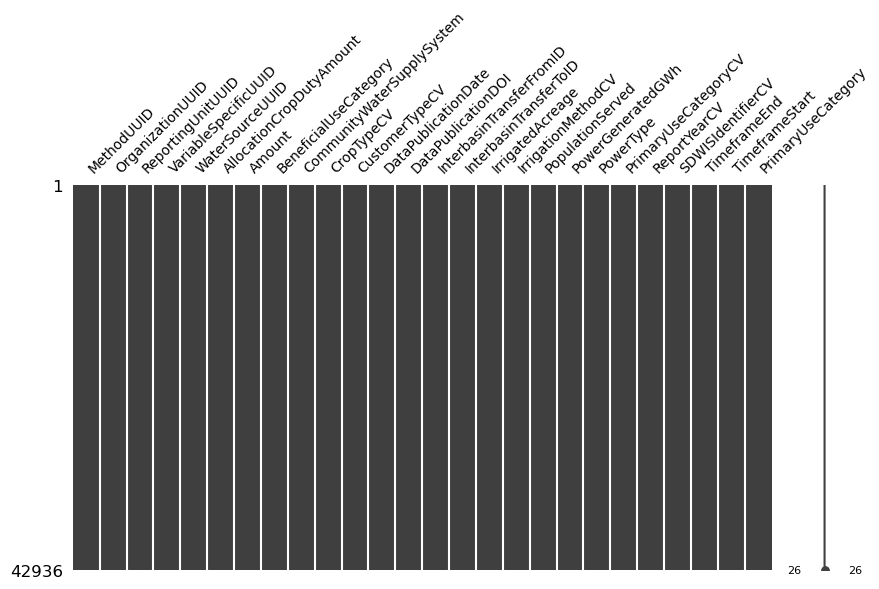

In [18]:
# Check what columns contain missing information.
msno.matrix(dfag, figsize=(10,5), fontsize=10)

In [19]:
# Unique values for 'AllocationCropDutyAmount'
for x in dfag['AllocationCropDutyAmount'].sort_values().unique():
    print(f'"' + str(x) + '",')

"",


In [20]:
# Unique values for 'CommunityWaterSupplySystem'
for x in dfag['CommunityWaterSupplySystem'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [21]:
# Unique values for 'CropTypeCV'
for x in dfag['CropTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [22]:
# Unique values for 'CustomerTypeCV'
for x in dfag['CustomerTypeCV'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [23]:
# Unique values for 'IrrigationMethodCV'
for x in dfag['IrrigationMethodCV'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [24]:
# Unique values for 'PopulationServed'
for x in dfag['PopulationServed'].sort_values().unique():
    print(f'"' + x + '",')

"",


In [25]:
# Unique values for 'BeneficialUseCategory'
uniqueList = list(set([i.strip() for i in ','.join(dfag['BeneficialUseCategory'].astype(str)).split(',')]))
uniqueList.sort()
uniqueList

['Agriculture',
 'Bottled Water',
 'Commercial',
 'Cranberries',
 'Fish Hatchery',
 'Golf/CC',
 'Hospital/Health',
 'Hydroelectric Power',
 'Industrial',
 'Military',
 'Mining',
 'Non-Agricultural Irrigation',
 'Nursery',
 'Parks/Recreation',
 'Prison',
 'Public Water Supply',
 'Refinery',
 'Remediation',
 'School',
 'Ski/Snowmaking',
 'Thermoelectric Power',
 'Unassociated GW',
 'Unassociated SW']

In [26]:
# Amount: Boxplot distribution of WaDE values
try:
    trace1 = go.Violin(x=dfag['Amount'], points='outliers', name='Violin Plot')
    trace2 = go.Histogram(x=dfag['Amount'], name='Historgram')

    fig = make_subplots(rows=2, cols=1)
    fig.add_trace(trace1, row=1, col=1)
    fig.add_trace(trace2, row=2, col=1)

    fig.update_layout(showlegend=False, bargap=0.2, title="Amount Distribution in aggregatedamounts.csv", font=dict(family="Arial Bold", size=12,color="Black"))
    fig.update_xaxes(title_text="Amount Value", row=1, col=1)
    fig.update_xaxes(title_text="Amount Value", row=2, col=1)
    fig.update_yaxes(title_text="Num. of Records", row=2, col=1)
    fig.show()
    fig.write_image('DataAssessment/figures/Amount.pdf', engine="kaleido")

except: print('Could not plot Amount value.')

In [27]:
# PrimaryUseCategory: histogram distribution of WaDE values
print(dfag.PrimaryUseCategory.value_counts())

fig = px.histogram(dfag, x="PrimaryUseCategory")
fig.update_layout(bargap=0.2,
                  title="Histogram of PrimaryUseCategory Entries in aggregatedamounts.csv",
                  xaxis_title="PrimaryUseCategoryCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/PrimaryUseCategory.pdf', engine="kaleido")

    42936
Name: PrimaryUseCategory, dtype: int64


In [28]:
# ReportYearCV: histogram distribution of WaDE values
print(dfag.ReportYearCV.value_counts())

fig = px.histogram(dfag, x="ReportYearCV")
fig.update_layout(bargap=0.2,
                  title="Histogram of ReportYearCV Entries in aggregatedamounts.csv",
                  xaxis_title="ReportYearCV Value",
                  yaxis_title="# of entries",
                  #legend_title="Legend Title",
                    font=dict(
                        family="Arial Bold",
                        size=12,
                        color="Black")
                 )
fig.show()
fig.write_image('DataAssessment/figures/ReportYearCV.pdf', engine="kaleido")

2003    1958
2015    1810
2016    1784
2012    1772
2017    1762
2014    1756
2013    1754
2008    1746
2011    1728
2010    1728
2007    1722
2005    1718
2009    1702
2006    1696
1998    1468
1994    1456
1995    1448
1997    1436
1996    1430
2000    1406
1993    1368
2004    1348
1992    1334
1991    1316
1990    1288
1999    1284
2001     872
2002     846
Name: ReportYearCV, dtype: int64


# Merge all figure pdfs into single output pdf

In [29]:
# merge all figure pdfs into single output pdf

'''
Notes:
'merger' is used for merging multiple files into one and merger.append(absfile) will append 
 the files one by one until all pdfs are appended in the result file.
'''

from PyPDF2 import PdfFileMerger

# If files are saved in the folder 'C:\Users' then Full_Path will be replaced with C:\Users
filePath = str(os.getcwd()) + '/DataAssessment/figures'
pdfsList = os.listdir(filePath)
print(pdfsList)


# os.listdir will create the list of all files in a directory
merger = PdfFileMerger(strict=False)

for file in pdfsList:
    if file.endswith(".pdf"):
        path_with_file = os.path.join(filePath, file)
        print(path_with_file)
        merger.append(path_with_file,  import_bookmarks=False )
merger.write("DataAssessment/Figures Merged Copy.pdf")

merger.close()

['WaterSourceTypeCV.pdf', 'ReportingUnitTypeCV.pdf', 'StateCV.pdf', 'PolyMap.pdf', 'Amount.pdf', 'PrimaryUseCategoryCV.pdf', 'ReportYearCV.pdf', 'PrimaryUseCategory.pdf']
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\WaterSourceTypeCV.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\ReportingUnitTypeCV.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\StateCV.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\PolyMap.pdf


C:\Users\rjame\anaconda3\lib\site-packages\PyPDF2\_utils.py:411: UserWarning:

import_bookmarks is deprecated as an argument. Use import_outline instead



G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\Amount.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\PrimaryUseCategoryCV.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\ReportYearCV.pdf
G:\Shared drives\WaDE Data\DelawareRiverBasinCommission\AggregatedAmounts/DataAssessment/figures\PrimaryUseCategory.pdf


# Removed Records compared to Source Data
- this is working just fine
- just want to comment out temporarily

In [30]:
# Explode purge.xlsx files by WaDEUUID, concat together
#################################################################

# Explode watersources_missing.csv records by WaDEUUID
dfwspurgeCopy = dfwspurge.assign(WaDEUUID=dfwspurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfwspurgeCopy = dfwspurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# Explode reportingunits_missing.csv records by WaDEUUID
dfrupurgeCopy = dfrupurge.assign(WaDEUUID=dfrupurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfrupurgeCopy = dfrupurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# Explode aggregatedamounts_missing.csv records by WaDEUUID
dfagpurgeCopy = dfagpurge.assign(WaDEUUID=dfagpurge['WaDEUUID'].str.split(',')).explode('WaDEUUID').reset_index(drop=True)
dfagpurgeCopy = dfagpurgeCopy[['WaDEUUID','ReasonRemoved','IncompleteField']]

# concat purge dataframes togehter
frames = [dfwspurgeCopy, dfrupurgeCopy, dfagpurgeCopy] 
dfWaDEUUID = pd.concat(frames)
dfWaDEUUID = dfWaDEUUID.drop_duplicates().reset_index(drop=True).replace(np.nan, "")
print(len(dfWaDEUUID))
dfWaDEUUID.head(1)

KeyError: 'WaDEUUID'

In [ ]:
# this is custom to the provided data

# attach purge dataframe to Native Source Data
# df1: 2060report_data-release_v2110_A1_6_9_11_14_17_22
#################################################################

if 'ReasonRemoved' in df1:
    df1 = df1.drop(['ReasonRemoved', 'IncompleteField'], axis=1)

df1Copy = dfWaDEUUID.merge(df1, how='right', on='WaDEUUID')
df1Copy = df1Copy.groupby('WaDEUUID').agg(lambda x: ','.join([str(elem) for elem in (list(set(x))) if elem!=''])).replace(np.nan, "").reset_index()
df1Copy.to_csv('RawInputData/2060report_data-release_v2110_A1_6_9_11_14_17_22.zip', compression=dict(method='zip', archive_name='2060report_data-release_v2110_A1_6_9_11_14_17_22.csv'), index=False)

# Custom Queries and Analysis for this Dataset

In [ ]:
# asdf